## Multi-Moda Chat

The multi-modal chat is a chat that can handle both text and image inputs. Because we are using 'gpt-4o-mini', which can understand image input. Therefore, we can send both text and image inputs to the agent.

In [1]:
from dataclasses import dataclass, field
from typing import List, Optional
import base64
from io import BytesIO
from autogen_core.base import MessageContext, AgentId, AgentInstantiationContext
from autogen_core.components import DefaultTopicId, RoutedAgent, default_subscription, message_handler
from autogen_core.components.code_executor import CodeExecutor, extract_markdown_code_blocks
from autogen_core.components.models import (
    AssistantMessage,
    ChatCompletionClient,
    LLMMessage,
    SystemMessage,
    UserMessage,
)
import tempfile
from autogen_core.components.tool_agent import ToolAgent, tool_agent_caller_loop
from autogen_core.application import SingleThreadedAgentRuntime
from autogen_core.components.models import OpenAIChatCompletionClient
import random

from autogen_core.base import CancellationToken
from autogen_core.components.tools import FunctionTool, ToolSchema
from autogen_core.components._image import Image
from typing_extensions import Annotated
from PIL import Image as PILImage
import os
from pydantic import BaseModel

# Load .env

In [ ]:
%load_ext dotenv
%dotenv .env

In [2]:
class Message(BaseModel):
    text: str
    source: Optional[str] = None
    image_url: Optional[str] = None # url or base64 encoded image

@default_subscription
class ImageAssistant(RoutedAgent):
    def __init__(self, model_client: ChatCompletionClient) -> None:
        super().__init__("An agent with tools")
        self._system_messages: List[LLMMessage] = [SystemMessage("You are a helpful AI assistant.")]
        self._model_client = model_client

    @message_handler
    async def handle_image_message(self, message: Message, ctx: MessageContext) -> None:
        # Create a session of messages.
        session: List[LLMMessage] = [UserMessage(content=[message.text, Image.from_base64(message.image_url)] , source="user")]
        # Return the final response.
        result = await self._model_client.create(session)

        print(f"\n{'-'*80}\nAssistant:\n{result.content}")
        await self.publish_message(Message(text=result.content), DefaultTopicId())

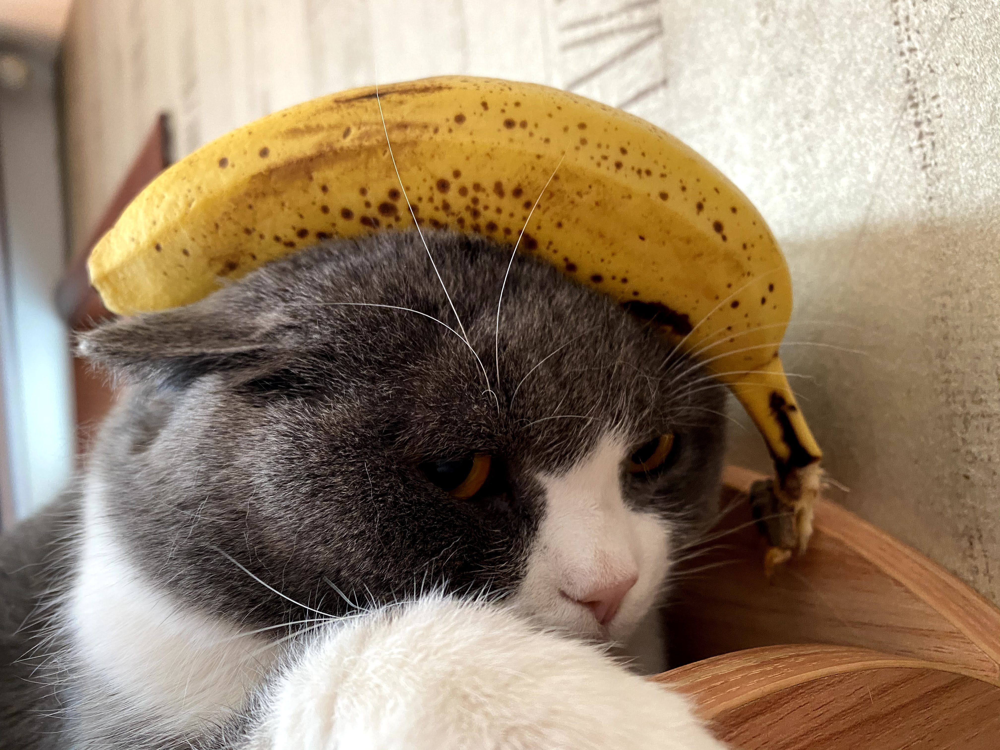

In [3]:
image_path = os.path.join(".", "images", "cat under banana.jpg")
image = PILImage.open(image_path)
image

In [4]:
# Start the runtime and publish a message to the assistant.
runtime = SingleThreadedAgentRuntime()

await ImageAssistant.register(
    runtime,
    type="assistant",
    factory=lambda: ImageAssistant(
        model_client=OpenAIChatCompletionClient(
            api_key=os.environ.get("OPENAI_API_KEY"),
            model="gpt-4o-mini"
        ),
    ),
)
runtime.start()
base64_image = base64.b64encode(open(image_path, "rb").read()).decode()
await runtime.publish_message(
    Message(text="what's in the image", image_url=base64_image, source="user"), DefaultTopicId()
)

await runtime.stop_when_idle()


--------------------------------------------------------------------------------
Assistant:
The image features a cat with a banana placed on its head. The cat appears to have gray fur with white patches, and it looks somewhat unamused or relaxed. The background includes some home decor elements, but the focus is primarily on the cat and the banana.


## Conclusion

Congratulations! You have successfully created an image assistant agent which can understand both text and image inputs.

## What we have learned
- How to create an assistant that can understand both text and image inputs.